# Exploratory Data Analysis on Vehicle Listings Dataset

This project analyzes a dataset of vehicle advertisements in the US. 
We aim to preprocess the data, explore trends, and visualize relationships between features.


In [36]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

In [37]:
df_cars=pd.read_csv('/Users/dineshsatram/Documents/project_sdt/vehicles_us.csv')
df_cars.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28


### Find and Remove Duplicate values

In [38]:
print(df_cars.duplicated().sum())

0


There are no duplictae values.

### Find and remove missing values

In [39]:
df_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


There are missing values in model_year, cylinders, odometer,paint_color, is_4wd columns.

In [40]:
missing_values = df_cars.isnull().sum().sort_values(ascending=False)
missing_percent = (missing_values / len(df_cars)) * 100
missing_data = pd.DataFrame({'Missing Count': missing_values, 'Percent': missing_percent})
missing_data


,Missing Count,Percent
is_4wd,25953,50.369723
paint_color,9267,17.985444
odometer,7892,15.316836
cylinders,5260,10.208637
model_year,3619,7.023775
price,0,0.000000
model,0,0.000000
condition,0,0.000000
fuel,0,0.000000
transmission,0,0.000000


In [41]:
for col in ['model', 'condition', 'fuel', 'transmission', 'type', 'paint_color']:
    print(f"{col}: {df_cars[col].unique()}")


model: ['bmw x5' 'ford f-150' 'hyundai sonata' 'chrysler 200' 'chrysler 300'
 'toyota camry' 'honda pilot' 'kia sorento' 'chevrolet silverado 1500'
 'honda accord' 'ram 1500' 'gmc yukon' 'jeep cherokee'
 'chevrolet traverse' 'hyundai elantra' 'chevrolet tahoe' 'toyota rav4'
 'chevrolet silverado' 'jeep wrangler' 'chevrolet malibu' 'ford fusion se'
 'chevrolet impala' 'chevrolet corvette' 'jeep liberty' 'toyota camry le'
 'nissan altima' 'subaru outback' 'toyota highlander' 'dodge charger'
 'toyota tacoma' 'chevrolet equinox' 'nissan rogue'
 'mercedes-benz benze sprinter 2500' 'honda cr-v' 'jeep grand cherokee'
 'toyota 4runner' 'ford focus' 'honda civic' 'kia soul'
 'chevrolet colorado' 'ford f150 supercrew cab xlt'
 'chevrolet camaro lt coupe 2d' 'chevrolet cruze' 'ford mustang'
 'chevrolet silverado 3500hd' 'nissan frontier crew cab sv'
 'subaru impreza' 'jeep grand cherokee laredo' 'nissan versa'
 'ford f-250 sd' 'chevrolet silverado 1500 crew' 'ford f250 super duty'
 'chevrolet cam

#### Handling Missing Values

In [42]:
# Fill missing values for 'model_year'
df_cars['model_year'] = df_cars.groupby('model')['model_year'].transform(lambda x: x.fillna(x.median()))

# Fill missing values for 'cylinders'
df_cars['cylinders'] = df_cars.groupby('model')['cylinders'].transform(lambda x: x.fillna(x.median()))

# Fill missing values for 'odometer'
df_cars['odometer'] = df_cars.groupby(['model', 'model_year'])['odometer'].transform(lambda x: x.fillna(x.median()))

# Remove rows with missing 'odometer' values
df_cars = df_cars.dropna(subset=['odometer'])

# Fill missing values for 'paint_color' with 'unknown'
df_cars['paint_color'] = df_cars['paint_color'].fillna('unknown')

# Fill missing values for 'is_4wd' with 0 (assume not 4WD)
df_cars['is_4wd'] = df_cars['is_4wd'].fillna(0)

# Verify that no missing values remain
missing_values = df_cars.isnull().sum()
print(missing_values)



price           0
model_year      0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
transmission    0
type            0
paint_color     0
is_4wd          0
date_posted     0
days_listed     0
dtype: int64


There are no more missing values now.

## Removing outliers

In [43]:
# Define thresholds for outliers
price_lower, price_upper = df_cars['price'].quantile([0.05, 0.95])
model_year_lower, model_year_upper = df_cars['model_year'].quantile([0.05, 0.95])

# Filter data to remove outliers
df_cars = df_cars[(df_cars['price'] >= price_lower) & (df_cars['price'] <= price_upper)]
df_cars = df_cars[(df_cars['model_year'] >= model_year_lower) & (df_cars['model_year'] <= model_year_upper)]


### Price Distribution

In [44]:
import plotly.express as px

# Scatter plot of price vs odometer
scatter_plot = px.scatter(
    df_cars, x='odometer', y='price', color='model_year',
    title="Price vs Odometer (Colored by Model Year)"
)
scatter_plot.show()

# Histogram of price distribution
price_histogram = px.histogram(df_cars, x='price', nbins=50, title="Price Distribution")
price_histogram.show()


### Relationship Between Variables

### Price vs. odometer

In [45]:
fig = px.scatter(df_cars, x='odometer', y='price', title='Price vs Odometer', trendline='ols')
fig.update_layout(xaxis_title='Odometer (Mileage)', yaxis_title='Price')
fig.show()


### Price vs. Model Year

In [46]:
fig = px.scatter(df_cars, x='odometer', y='price', title='Price vs Odometer', trendline='ols')
fig.update_layout(xaxis_title='Odometer (Mileage)', yaxis_title='Price')
fig.show()


### Price Vs. Model Year

In [47]:
fig = px.scatter(df_cars, x='model_year', y='price', title='Price vs Model Year', trendline='ols')
fig.update_layout(xaxis_title='Model Year', yaxis_title='Price')
fig.show()


### Categorical Data Analysis

In [48]:
fig = px.histogram(df_cars, x='type', title='Distribution of Vehicle Types')
fig.update_layout(xaxis_title='Vehicle Type', yaxis_title='Count')
fig.show()


In [49]:
fig = px.histogram(df_cars, x='condition', title='Distribution of Vehicle Conditions')
fig.update_layout(xaxis_title='Condition', yaxis_title='Count')
fig.show()


### Aggregate Insighs

In [50]:
avg_price_by_type = df_cars.groupby('type')['price'].mean().sort_values(ascending=False)
fig = px.bar(x=avg_price_by_type.index, y=avg_price_by_type.values, 
             title='Average Price by Vehicle Type', labels={'x': 'Vehicle Type', 'y': 'Average Price'})
fig.show()


In [51]:
avg_price_by_condition = df_cars.groupby('condition')['price'].mean().sort_values(ascending=False)
fig = px.bar(x=avg_price_by_condition.index, y=avg_price_by_condition.values, 
             title='Average Price by Vehicle Condition', labels={'x': 'Condition', 'y': 'Average Price'})
fig.show()


### Correlation Analysis

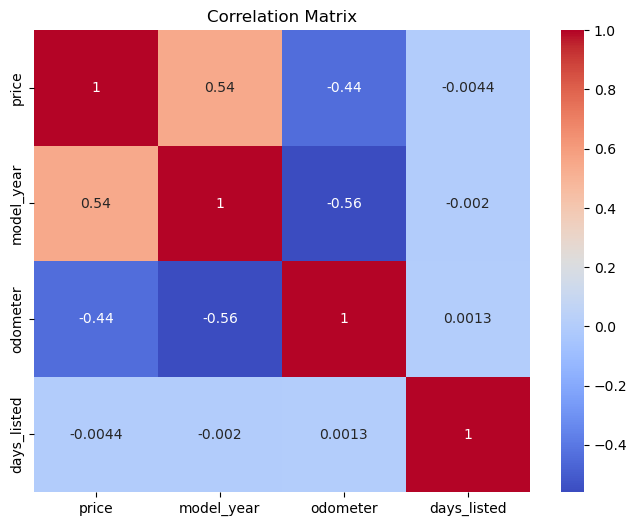

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix
correlation = df_cars[['price', 'model_year', 'odometer', 'days_listed']].corr()

# Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()



### Key Findings

Price: Most vehicles are priced below $20,000, with some outliers.

Mileage: Majority of vehicles have mileage below 150,000 miles.

Vehicle Types: SUVs and pickup trucks are common and tend to have higher prices.

Condition: Vehicles in "excellent" condition are significantly pricier.